In [1]:
import sys

sys.path.append("../")

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from rumboost.rumboost import rum_train
from rumboost.datasets import load_preprocess_LPMC
from rumboost.utility_plotting import plot_parameters
from rumboost.metrics import cross_entropy

import lightgbm

# Example: Simple RUMBoost

This notebook shows features implemented in RUMBoost through an example on the LPMC dataset, a mode choice dataset in London developed Hillel et al. (2018). You can find the original source of data [here](https://www.icevirtuallibrary.com/doi/suppl/10.1680/jsmic.17.00018) and the original paper [here](https://www.icevirtuallibrary.com/doi/full/10.1680/jsmic.17.00018).

We first load the preprocessed dataset and its folds for cross-validation. You can find the data under the Data folder

In [4]:
# load dataset
LPMC_train, LPMC_test, folds = load_preprocess_LPMC(path="../Data/")

## Training and testing a RUMBoost model

In order to train a rumboost model, you need to:

- specify a model specification
- put your data in a lightgbm Dataset object

### Model specification

The model specification in rumboost is done with a python dictionary, and is composed of two required keys:

1. `general_params` where all general parameters regarding rumboost training are set
2. `rum_structure` where the random utility specification is specified

#### General parameters

You can find an example of general parameters below. Unless stated otherwise, the parameters are the same than in LightGBM, since these parameters are applied directly to LightGBM Booster objects. You can find more information in the LightGBM [docs](https://lightgbm.readthedocs.io/en/stable/Parameters.html#).  For a simple RUMBoost, we recommend letting most of the parameters with default values, as RUMBoost is less sensitive to overfitting. **For a multiclass classification problem, you need to specify the num_classes parameter with the appropriate number of classes**.

In [5]:
# parameters
general_params = {
    "n_jobs": -1,
    "num_classes": 4,  # important
    "verbosity": 1,  # specific RUMBoost parameter
    "num_iterations": 3000,
    "early_stopping_round": 100,
}

### Random Utility Model structure

This is the core constraints applied to rumboost, learnt from random utility models. We define it as a list of dictionaries, where each dictionary describe the RUM structure of an alternative. You can define it as follows:

```
rum_structure  = [
                    {
                        'utility: [0]
                        'variables': ['feature1', 'feature2', 'feature3', ...],
                        'boosting_params': {
                            'monotone_constraints': [0, 1, -1, ...],
                            'interaction_constraints': [[0], [1], [2], ...],
                            **kwargs,
                        },
                        'shared': False,
                    }
                    {
                        'utility: [1]
                        'variables': ['feature1', 'feature2', 'feature3', ...],
                        'boosting_params': {
                            'monotone_constraints': [0, 1, -1, ...],
                            'interaction_constraints': [[0], [1], [2], ...],
                            **kwargs,
                        },
                        'shared': False,
                    }
                    ...
                ]
```

`'utility'` specify to which alternative this RUM structure belongs to. It can be a list of alternatives if the modeller wants to define the same structure for several alternatives or if the tree ensembles are shared across alternatives.

```'variables'``` gives the list of features by their columns string name that are part of an alternative. It is used to define alternative-specific variables.

`'boosting_params'` states the lightgbm parameters to be applied to each ensemble. It can be any LightGBM parameters. The most important are:
- ```'monotone_constraints'``` specify which features have monotone constraints. 1 means positive monotonic constraint, -1 means negative monotonic constraint, and 0 means no monotonicity constraint. The constraints must be specified for all features used in the alternative, and will be applied in the order of the ```'columns'``` list (i.e. in this example 'feature1' has no constraint etc.). More information from LightGBM [docs](https://lightgbm.readthedocs.io/en/stable/Parameters.html#learning-control-parameters).
- ```'interaction_constraints'``` specify how the feature interacts with each other. It is defined in the same way than LightGBM ```interaction_constraint``` parameter. More info [here](https://lightgbm.readthedocs.io/en/stable/Parameters.html#learning-control-parameters). Basically, each feature that are not in the same list won't be able to interact.
- `'learning_rate'` is the boosting learning rate.
- `'max_depth'` controls the depth of regression trees. It is important to set it to 1 for the ensemble interpretability.
- `'monotone_constraints_method'` should be set to `'advanced'` for best results.

`'shared'` is a boolean variable stating if the ensemble should be shared across the alternatives specified in the `'utility'` key.

You can find an example of simple RUM structure (MNL) for the LPMC dataset below.

In [6]:
rum_structure = [
    {
        "utility": [0],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_walking",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
            ],
        },
        "shared": False,
    },
    {
        "utility": [1],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_cycling",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
            ],
        },
        "shared": False,
    },
    {
        "utility": [2],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_pt_access",
            "dur_pt_bus",
            "dur_pt_rail",
            "dur_pt_int_waiting",
            "dur_pt_int_walking",
            "pt_n_interchanges",
            "cost_transit",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
                [17],
                [18],
                [19],
                [20],
                [21],
                [22],
            ],
        },
        "shared": False,
    },
    {
        "utility": [3],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_driving",
            "cost_driving_fuel",
            "congestion_charge",
            "driving_traffic_percent",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
                -1,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
                [17],
                [18],
                [19],
            ],
        },
        "shared": False,
    },
]

In [8]:
model_specification = {
    "general_params": general_params,
    "rum_structure": rum_structure,
}

### Training and testing dataset

We specify training and testing dataset as LightGBM dataset object. More information [here](https://lightgbm.readthedocs.io/en/stable/pythonapi/lightgbm.Dataset.html). **It is crucial to specify ```free_raw_data=False``` since datasets need to be constructed within rumboost.**

In [9]:
# features and label column names
features = [f for f in LPMC_train.columns if f != "choice"]
label = "choice"

# create lightgbm dataset
lgb_train_set = lightgbm.Dataset(
    LPMC_train[features], label=LPMC_train[label], free_raw_data=False
)
lgb_test_set = lightgbm.Dataset(
    LPMC_test[features], label=LPMC_test[label], free_raw_data=False
)

### Cross-validation

Cross-validation within RUMBoost is currently not implemented. But it is possible to train 5 RUMBoost models on 5 different folds, and average their results to find the number of trees needed. Note: the numbers of trees may vary from the paper because of the randomness when creating the folds.

We train a RUMBoost object with the ```rum_train()``` function.

In [10]:
ce_loss = 0
num_trees = 0
for i, (train_idx, test_idx) in enumerate(folds):

    # create the lightgbm CV training and validation set
    train_set = lgb_train_set.subset(sorted(train_idx))
    test_set = lgb_train_set.subset(sorted(test_idx))

    print("-" * 50 + "\n")
    print(f"Iteration {i+1}")

    # train the model with rum_train
    LPMC_model_trained = rum_train(
        train_set, model_specification, valid_sets=[test_set]
    )

    # aggregate results
    ce_loss += LPMC_model_trained.best_score
    num_trees += LPMC_model_trained.best_iteration

    print("-" * 50 + "\n")
    print(f"Best cross entropy loss: {LPMC_model_trained.best_score}")
    print(f"Best number of trees: {LPMC_model_trained.best_iteration}")

ce_loss = ce_loss / 5
num_trees = num_trees / 5
print("-" * 50 + "\n")
print(f"Cross validation negative cross entropy loss: {ce_loss}")
print(f"With a number of trees on average of {num_trees}")

--------------------------------------------------

Iteration 1
[LightGBM] [Info] Number of positive: 7667, number of negative: 36145
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 43812, number of used features: 17
[LightGBM] [Info] Number of positive: 7667, number of negative: 36145
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 43812, number of used features: 17
[LightGBM] [Info] Number of positive: 7667, number of negative: 36145
[LightGBM] [Warn

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
c:\Users\ucesnjs\anaconda32\envs\old_rumboost\Lib\site-packages\lightgbm\basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1367
[LightGBM] [Info] Number of data points in the train set: 43812, number of used features: 20
[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Using self-defined objective function
[1]------NCE value on train set : 1.2972
---------NCE value on test set 1: 1.2979
[11]-----NCE value on train set : 0.9288
---------NCE value on test set 1: 0.9330
[21]-----NCE value on train set : 0.8208
---------NCE value on test set 1: 0.8248
[31]-----NCE value on train set : 0.7740
---------NCE value on test set 1: 0.7781
[41]-----NCE value on train set : 0.7484
---------NCE value on test set 1: 0.753

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1]------NCE value on train set : 1.2978
---------NCE value on test set 1: 1.2968
[11]-----NCE value on train set : 0.9305
---------NCE value on test set 1: 0.9274
[21]-----NCE value on train set : 0.8220
---------NCE value on test set 1: 0.8196
[31]-----NCE value on train set : 0.7756
---------NCE value on test set 1: 0.7730
[41]-----NCE value on train set : 0.7502
---------NCE value on test set 1: 0.7471
[51]-----NCE value on train set : 0.7337
---------NCE value on test set 1: 0.7301
[61]-----NCE value on train set : 0.7220
---------NCE value on test set 1: 0.7183
[71]-----NCE value on train set : 0.7132
---------NCE value on test set 1: 0.7090
[81]-----NCE value on train set : 0.7062
---------NCE value on test set 1: 0.7021
[91]-----NCE value on train set : 0.7005
---------NCE value on test set 1: 0.6965
[101]----NCE value on train set : 0.6957
---------NCE value on test set 1: 0.6915
[111]----NCE value on train set : 0.6916
---------NCE value on test set 1: 0.6874
[121]----NCE val

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1]------NCE value on train set : 1.2976
---------NCE value on test set 1: 1.2967
[11]-----NCE value on train set : 0.9309
---------NCE value on test set 1: 0.9262
[21]-----NCE value on train set : 0.8225
---------NCE value on test set 1: 0.8171
[31]-----NCE value on train set : 0.7757
---------NCE value on test set 1: 0.7705
[41]-----NCE value on train set : 0.7500
---------NCE value on test set 1: 0.7456
[51]-----NCE value on train set : 0.7331
---------NCE value on test set 1: 0.7296
[61]-----NCE value on train set : 0.7210
---------NCE value on test set 1: 0.7185
[71]-----NCE value on train set : 0.7119
---------NCE value on test set 1: 0.7105
[81]-----NCE value on train set : 0.7046
---------NCE value on test set 1: 0.7044
[91]-----NCE value on train set : 0.6986
---------NCE value on test set 1: 0.6996
[101]----NCE value on train set : 0.6936
---------NCE value on test set 1: 0.6955
[111]----NCE value on train set : 0.6894
---------NCE value on test set 1: 0.6920
[121]----NCE val

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1]------NCE value on train set : 1.2968
---------NCE value on test set 1: 1.2984
[11]-----NCE value on train set : 0.9275
---------NCE value on test set 1: 0.9352
[21]-----NCE value on train set : 0.8188
---------NCE value on test set 1: 0.8277
[31]-----NCE value on train set : 0.7721
---------NCE value on test set 1: 0.7819
[41]-----NCE value on train set : 0.7465
---------NCE value on test set 1: 0.7571
[51]-----NCE value on train set : 0.7298
---------NCE value on test set 1: 0.7412
[61]-----NCE value on train set : 0.7179
---------NCE value on test set 1: 0.7299
[71]-----NCE value on train set : 0.7091
---------NCE value on test set 1: 0.7216
[81]-----NCE value on train set : 0.7021
---------NCE value on test set 1: 0.7149
[91]-----NCE value on train set : 0.6963
---------NCE value on test set 1: 0.7097
[101]----NCE value on train set : 0.6914
---------NCE value on test set 1: 0.7052
[111]----NCE value on train set : 0.6872
---------NCE value on test set 1: 0.7014
[121]----NCE val

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[1]------NCE value on train set : 1.2973
---------NCE value on test set 1: 1.2971
[11]-----NCE value on train set : 0.9288
---------NCE value on test set 1: 0.9306
[21]-----NCE value on train set : 0.8200
---------NCE value on test set 1: 0.8242
[31]-----NCE value on train set : 0.7730
---------NCE value on test set 1: 0.7788
[41]-----NCE value on train set : 0.7472
---------NCE value on test set 1: 0.7542
[51]-----NCE value on train set : 0.7304
---------NCE value on test set 1: 0.7383
[61]-----NCE value on train set : 0.7186
---------NCE value on test set 1: 0.7270
[71]-----NCE value on train set : 0.7096
---------NCE value on test set 1: 0.7186
[81]-----NCE value on train set : 0.7024
---------NCE value on test set 1: 0.7121
[91]-----NCE value on train set : 0.6966
---------NCE value on test set 1: 0.7070
[101]----NCE value on train set : 0.6917
---------NCE value on test set 1: 0.7027
[111]----NCE value on train set : 0.6875
---------NCE value on test set 1: 0.6990
[121]----NCE val

### Testing the model on out-of-sample data

Now that we have the optimal number of trees (1276), we can train the final version of the model on the full dataset, and test it on out-of-sample data with the ```predict()``` function. Note that the dataset must be a lightgbm object in the ```predict()``` function.

In [20]:
general_params["num_iterations"] = 1276
general_params["early_stopping_round"] = None

LPMC_model_fully_trained = rum_train(lgb_train_set, model_specification)

preds = LPMC_model_fully_trained.predict(lgb_test_set)

ce_test = cross_entropy(preds, lgb_test_set.get_label().astype(int))

print("-" * 50)
print(f"Final negative cross-entropy on the test set: {ce_test}")

c:\Users\ucesnjs\OneDrive - University College London\Documents\PhD - UCL\rumboost-dev\examples\..\rumboost\rumboost.py:1815: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] Number of positive: 9584, number of negative: 45182
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 854
[LightGBM] [Info] Number of data points in the train set: 54766, number of used features: 17
[LightGBM] [Info] Number of positive: 9584, number of negative: 45182
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 854
[LightGBM] [Info] Number of data points in the train set: 54766, number of used features: 17
[LightGBM] [Info] Number of positive: 9584, number of negative: 45182
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of tes

## Plotting parameter values

After training, we can plot the parameter values with the ```plot_parameters()``` function. We require the following arguments:

- The model trained
- The dataset (as a DataFrame)
- A dictionary to define the name of alternatives in the form: ```{'0':'name_alt_0', '1':'name_alt_1', ...}```


There are a lot of options, we recommend using ```asc_normalised=True```, ```only_1d=False``` to get several parameters on a plot, and ```save_figure``` to save a figure in the ```save_file=''```.


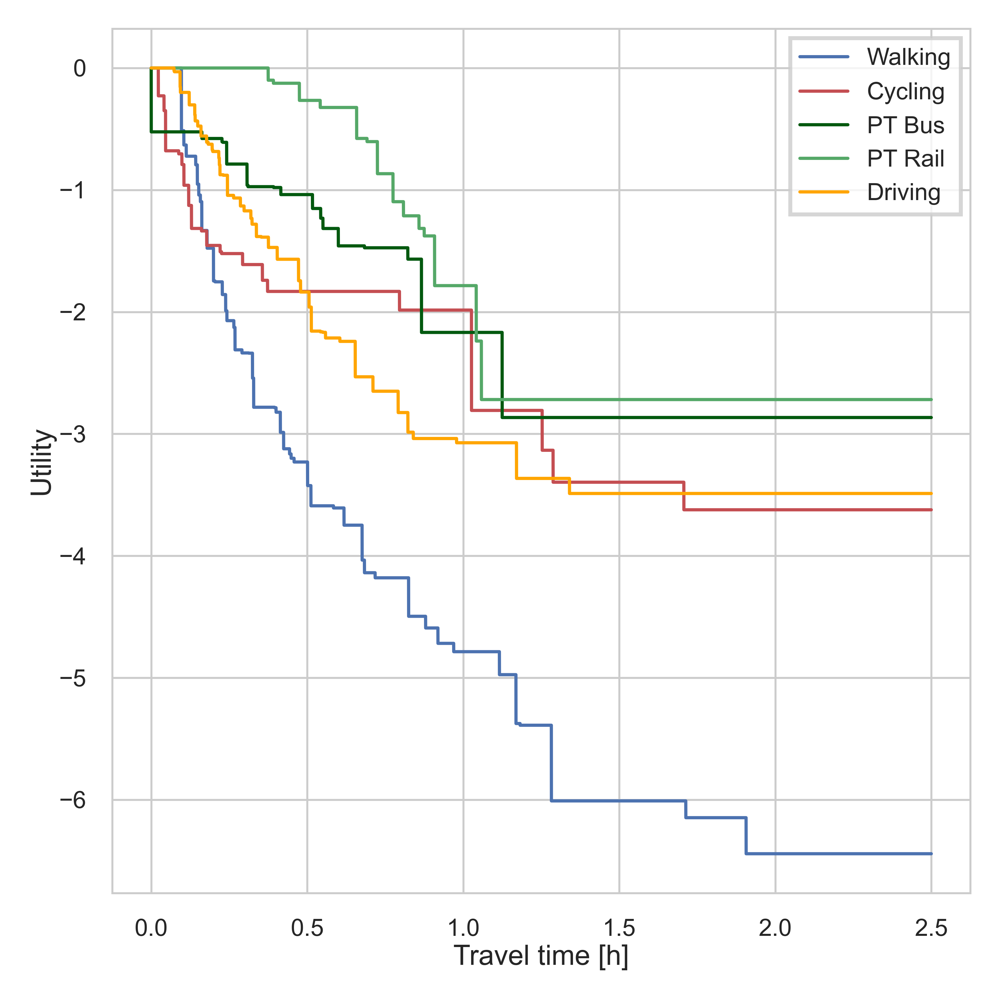

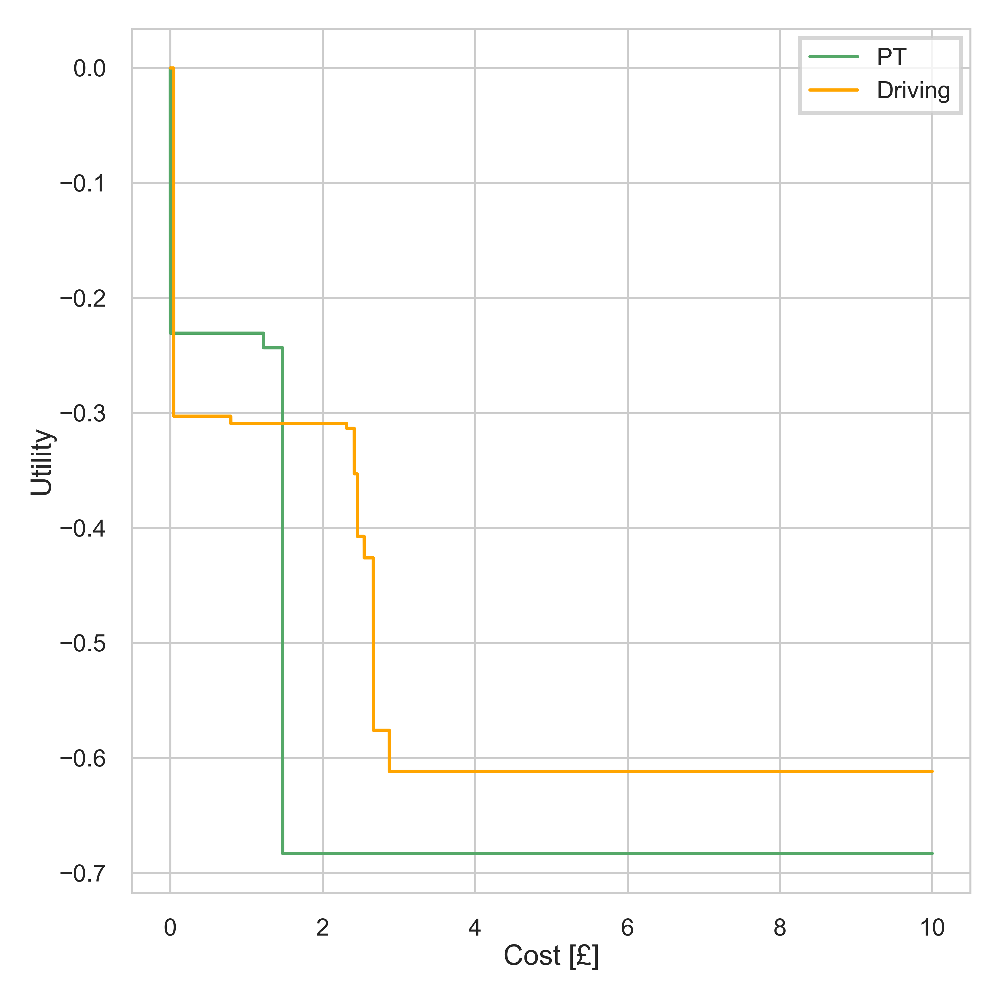

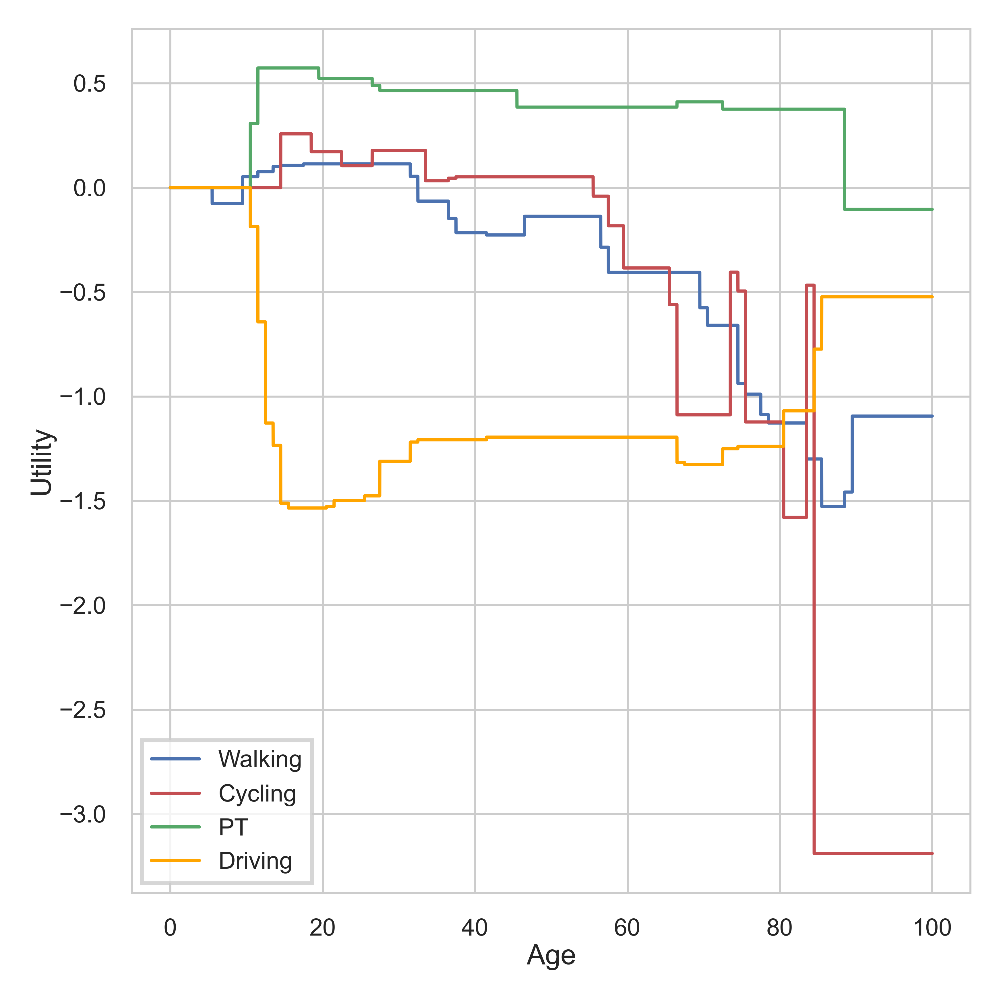

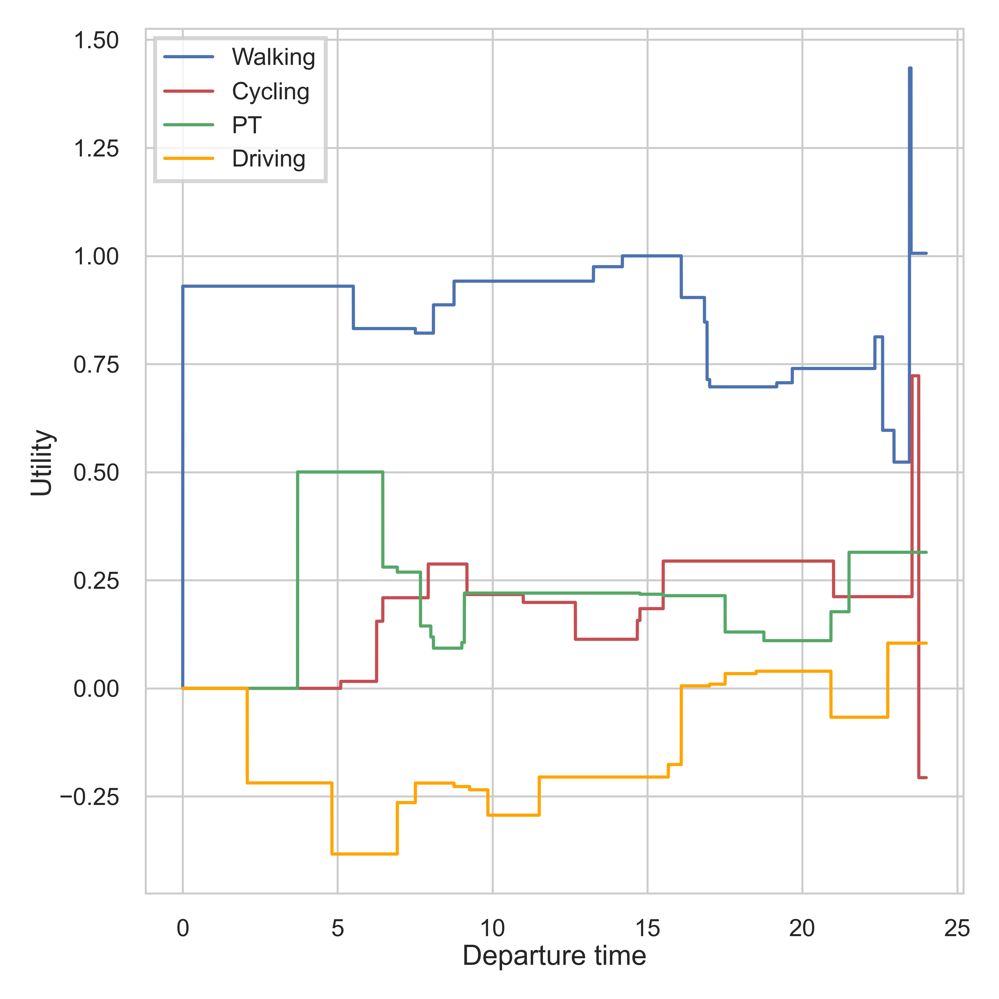

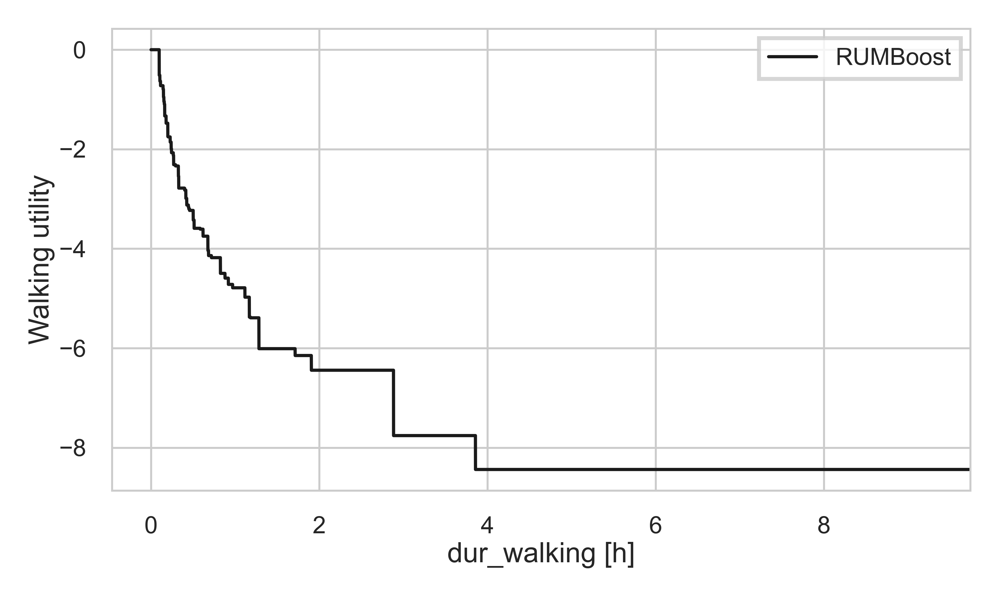

...

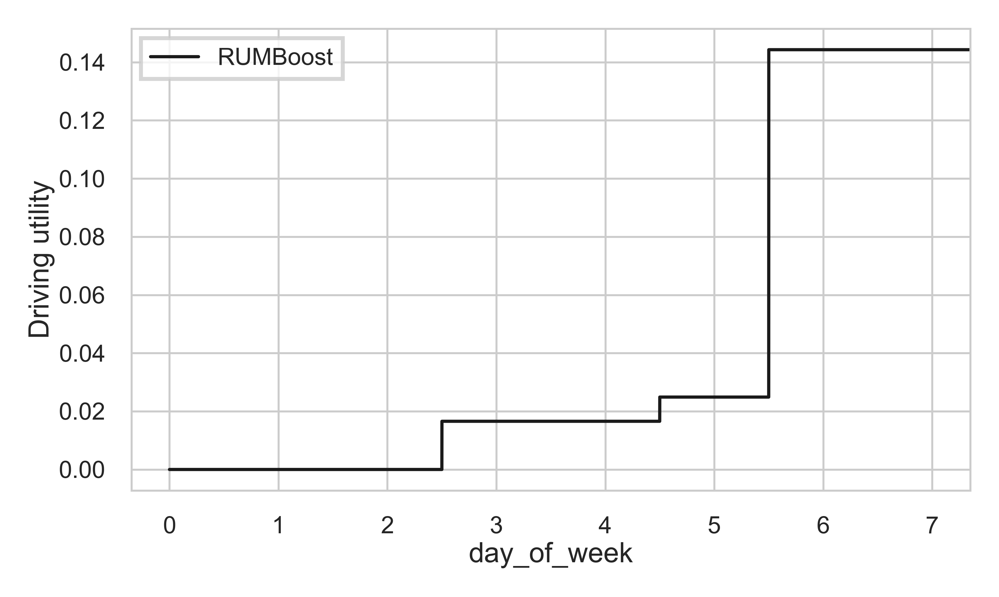

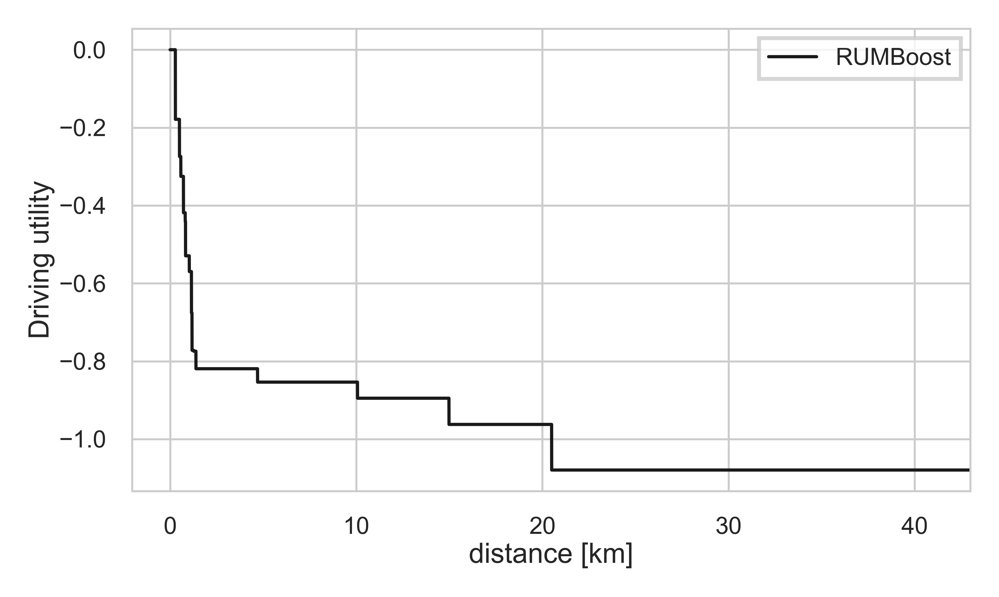

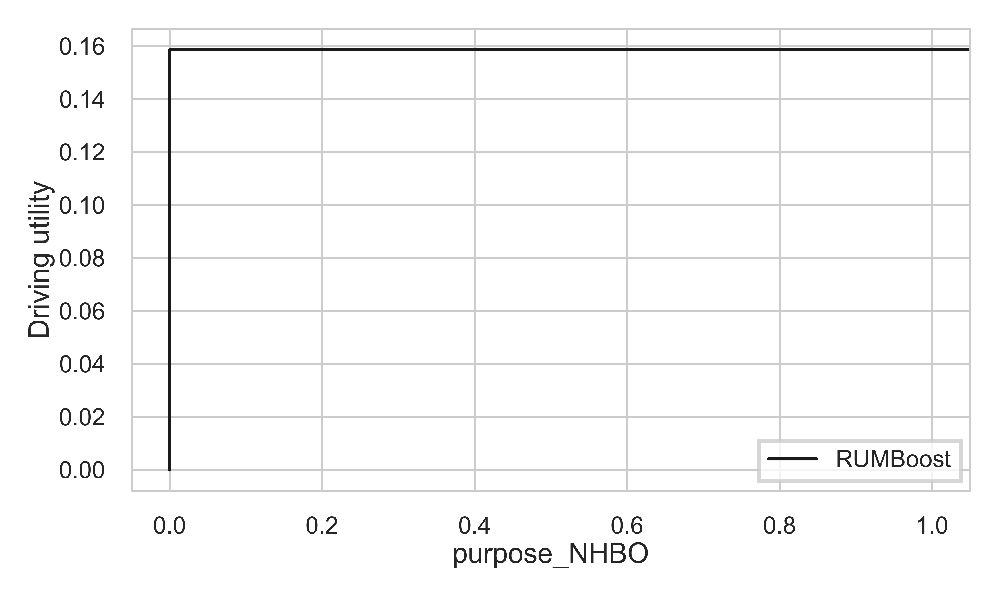

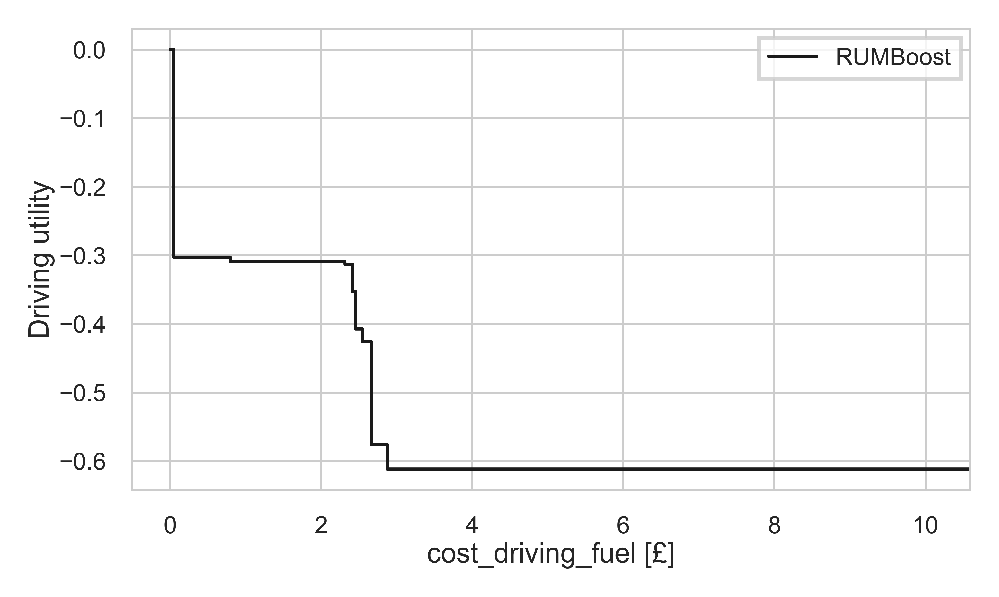

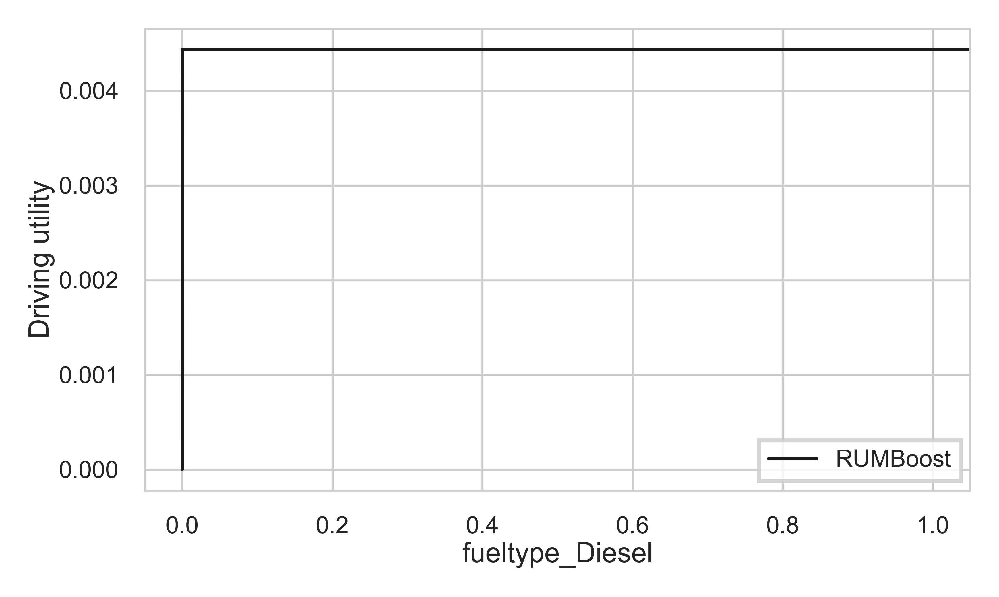

In [21]:
utility_names = {
    "0": "Walking",
    "1": "Cycling",
    "2": "Public Transport",
    "3": "Driving",
}

plot_parameters(
    LPMC_model_fully_trained,
    LPMC_train,
    utility_names,
    only_1d=False,
)

# References

Salvadé, N., & Hillel, T. (2024). Rumboost: Gradient Boosted Random Utility Models. *arXiv preprint [arXiv:2401.11954](https://arxiv.org/abs/2401.11954)*

Hillel, T., Elshafie, M.Z.E.B., Jin, Y., 2018. Recreating passenger mode choice-sets for transport simulation: A case study of London, UK. Proceedings of the Institution of Civil Engineers - Smart Infrastructure and Construction 171, 29–42. https://doi.org/10.1680/jsmic.17.00018